# Objective And Problem Statement

```A request for proposal (RFP) is an open request for bids to complete a new project proposed by the company or other organization that issues it```
## Focus Of Analytics Project :
- marketing team will be interest to see if they can `increase their efficiency`
- the management team want to know if using advanced analytics may `increase sales` in general.
- ```the details of the algorithm```

## Tasks
    We need a consultant to discuss the following: 
    • Think about how you will be conducting the business conversation (purpose, agenda … etc.) 
    • Discuss and confirm your understanding of the organization’s business climate and goals 
    • Explore the problem and its impact to the company 
    • Communicate the business value of your advanced analytics platform offering that addresses the problem or need the customer has communicated
    • Address any customer objections
    • Explaining the details of the machine learning model is crucial. Pick a model at your choice (e.g. Logistic Regression) and be ready to go through the details of the algorithm.
    • Close the meeting with clear next step(s)

# Attributes:
- `country`:	Country name
- `article`: 	6 digit article number, as unique identifier of an article
- `sales`: 		total number of units sold in respective retail week
- `regular_price` : 	recommended retail price of the article
- `current_price` :  current selling price (weighted average over the week)
- `ratio` : 		price ratio as current_price/regular_price, such that price discount is 1-ratio 
- `retailweek` : 	start date of the retailweek
- `promo1` : 	indicator for media advertisement, taking 1 in weeks of activation and 0 otherwise
- `promo2` : 	indicator for store events, taking 1 in weeks with events and 0 otherwise
- `customer_id` : 	customer unique identifier, one id per customer
- `article` :  	6 digit article number, as unique identifier of an article
- `productgroup` : 	product group the article belongs to
- `category` : 	product category the article belongs to
- `cost` : 		total costs of the article (assumed to be fixed over time)
- `style` : 		description of article design
- `sizes` : 		size range in which article is available
- `gender` : 	gender of target consumer of the article
- `rgb_*_main_color`:	intensity of the red (r), green (g), and blue (b) primaries of the article‘s  main color, 		taking values [0,250]
- `rgb_*_sec_color`:	intensity of the red (r), green (g), and blue (b) primaries of the article‘s secondary 		color, taking values [0,250]
- `label`:		advertisement result after offering/sending/presenting the offer to the customer. 0 means the customer did not buy and 1 means the costumer did buy.

## Description
- ```article``` 477 distinct values	High ```cardinality```
- ```retailweek``` 123 distinct Weeks	High ```cardinality```
- ```regular_price``` is highly overall correlated with current_price	High ```correlation```
- ```current_price``` is highly overall correlated with regular_price	High ```correlation```
- ```productgroup``` is highly overall correlated with cost 	High ```correlation```
- ```category``` is highly overall correlated with cost 	High ```correlation```
- ```style``` is highly overall correlated with cost 	High ```correlation```
- ```sizes``` is highly overall correlated with cost 	High ```correlation```
- ```gender``` is highly overall correlated with cost 	High ```correlation```
- ```closest_colors_main``` is highly overall correlated with cost 	High ```correlation```
- ```closest_colors_sec``` is highly overall correlated with cost 	High ```correlation```
- ```promo1``` is highly imbalanced (66.5%)	```Imbalance```
- ```promo2``` is highly imbalanced (95.5%)	```Imbalance```
- ```sizes``` is highly imbalanced (53.1%)	```Imbalance```
- ```article```.1 is uniformly distributed	```Uniform```


# Importing Libraries

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from ydata_profiling import ProfileReport

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
#import imblearn

%matplotlib inline

# Loading Data

In [2]:
df_origin = pd.read_csv('Data/Youssef Gamal - full_gen_data.csv')

df_origin.head()

,country,article,sales,regular_price,current_price,ratio,retailweek,promo1,promo2,customer_id,...,style,sizes,gender,rgb_r_main_col,rgb_g_main_col,rgb_b_main_col,rgb_r_sec_col,rgb_g_sec_col,rgb_b_sec_col,label
0,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,slim,"xxs,xs,s,m,l,xl,xxl",women,205,104,57,255,187,255,0
1,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,regular,"xxs,xs,s,m,l,xl,xxl",women,188,238,104,255,187,255,0
2,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,regular,"xxs,xs,s,m,l,xl,xxl",women,205,173,0,255,187,255,0
3,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,regular,"xxs,xs,s,m,l,xl,xxl",kids,205,140,149,164,211,238,0
4,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,regular,"xxs,xs,s,m,l,xl,xxl",women,138,43,226,164,211,238,0


In [3]:
# coping data
df = df_origin.copy()

# Visualizing and Exploration

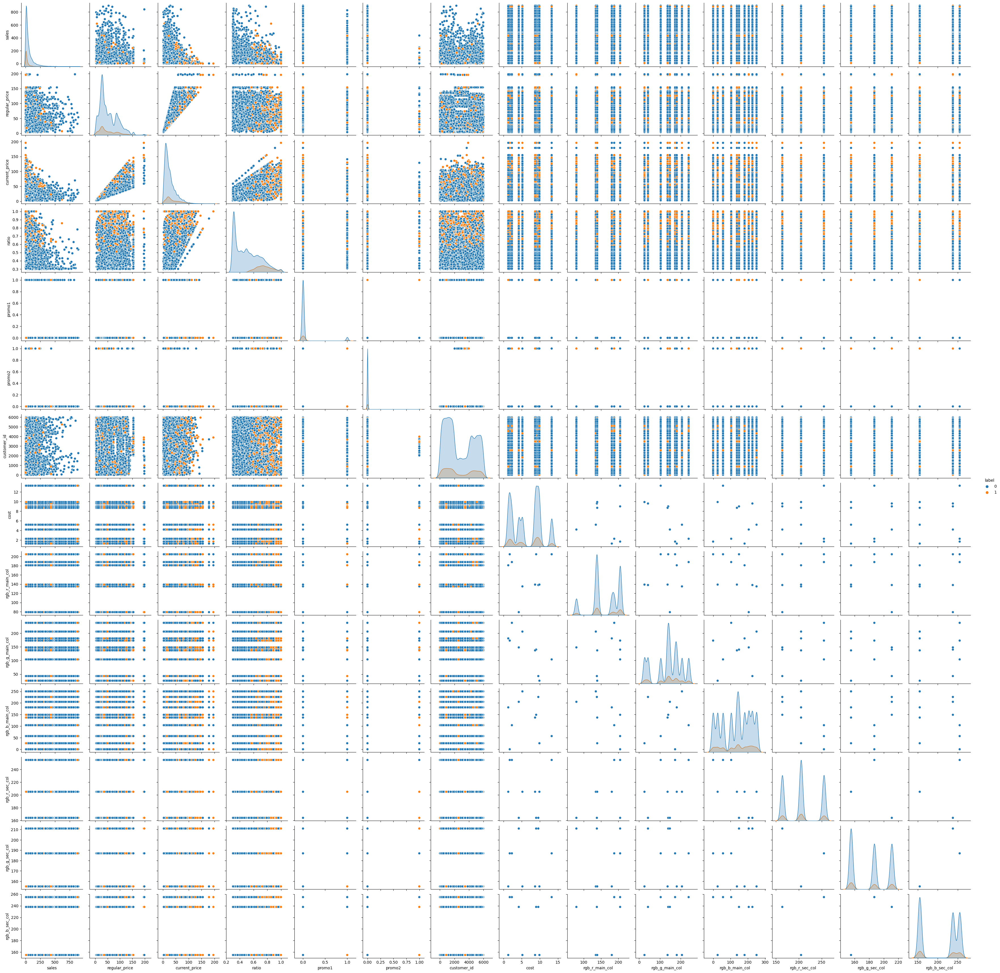

In [4]:
sns.pairplot(df,hue='label')
plt.savefig("./Images/pair_PLot_Sports_Gear_Wear")

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.columns

Index(['country', 'article', 'sales', 'regular_price', 'current_price',
       'ratio', 'retailweek', 'promo1', 'promo2', 'customer_id', 'article.1',
       'productgroup', 'category', 'cost', 'style', 'sizes', 'gender',
       'rgb_r_main_col', 'rgb_g_main_col', 'rgb_b_main_col', 'rgb_r_sec_col',
       'rgb_g_sec_col', 'rgb_b_sec_col', 'label'],
      dtype='object')

## Exploration Colors

In [7]:
df['rgb_r_sec_col'].value_counts().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of rgb_r_sec_col
205    40000
255    30000
164    30000
Name: count, dtype: int64>

In [8]:
import color_constants as cc

In [9]:
## PLaying with colors 
# Getting the clossest colors of the porposed colors 

def closest(colors,color):
    ''' using numpy to identify the closest color '''
    colors = np.array(colors)
    color = np.array(color)
    distances = np.sqrt(np.sum((colors-color)**2,axis=1))
    index_of_smallest = np.where(distances==np.amin(distances))
    smallest_distance = colors[index_of_smallest]
    return smallest_distance 

#list_of_colors = [[255,0,0],[150,33,77],[75,99,23],[45,88,250],[250,0,255]]
#color = [155,155,155]
#closest_color = closest(list_of_colors,color)
#print(closest_color )

In [10]:
# Dictionary of rgbColors and their resbonding color names  
# {(240, 248, 255) : 'aliceblue'}
list_names_colors = {(j[0],j[1],j[2]):i for j,i in zip(cc.colors.values(),cc.colors.keys())}
list_names_colors[(240, 248, 255)]

'aliceblue'

In [11]:
list_colors = [[j[0],j[1],j[2]]for j in cc.colors.values()]
#list_colors

In [12]:
# List of rgb Colors in the dataset
list_colors_main_in_df = [[j[0],j[1],j[2]] for j in zip(df['rgb_r_main_col'],df['rgb_g_main_col'] , df['rgb_b_main_col'])]
list_colors_sec_in_df = [[j[0],j[1],j[2]] for j in zip(df['rgb_r_sec_col'],df['rgb_g_sec_col'] , df['rgb_b_sec_col'])]
#list_colors_main_in_df

In [13]:
closest_colors_main = [list(closest(list_colors,color)[0]) for color in list_colors_main_in_df]
closest_colors_sec = [list(closest(list_colors,color)[0]) for color in list_colors_sec_in_df]

In [14]:
df["closest_colors_main"] = [list_names_colors[tuple(color)] for color in tuple(closest_colors_main)]
df["closest_colors_sec"] = [list_names_colors[tuple(color)] for color in tuple(closest_colors_sec)]
df.head()

,country,article,sales,regular_price,current_price,ratio,retailweek,promo1,promo2,customer_id,...,gender,rgb_r_main_col,rgb_g_main_col,rgb_b_main_col,rgb_r_sec_col,rgb_g_sec_col,rgb_b_sec_col,label,closest_colors_main,closest_colors_sec
0,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,205,104,57,255,187,255,0,sienna3,plum1
1,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,188,238,104,255,187,255,0,darkolivegreen2,plum1
2,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,205,173,0,255,187,255,0,gold3,plum1
3,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,kids,205,140,149,164,211,238,0,lightpink3,lightskyblue2
4,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,138,43,226,164,211,238,0,blueviolet,lightskyblue2


In [15]:
df.head()

,country,article,sales,regular_price,current_price,ratio,retailweek,promo1,promo2,customer_id,...,gender,rgb_r_main_col,rgb_g_main_col,rgb_b_main_col,rgb_r_sec_col,rgb_g_sec_col,rgb_b_sec_col,label,closest_colors_main,closest_colors_sec
0,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,205,104,57,255,187,255,0,sienna3,plum1
1,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,188,238,104,255,187,255,0,darkolivegreen2,plum1
2,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,205,173,0,255,187,255,0,gold3,plum1
3,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,kids,205,140,149,164,211,238,0,lightpink3,lightskyblue2
4,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,...,women,138,43,226,164,211,238,0,blueviolet,lightskyblue2


In [16]:
color=[205 ,104,57]
closest(list_colors,color)

array([[205, 104,  57]])

In [17]:
list_names_colors[(205, 104,  57)]

'sienna3'

In [18]:
df['closest_colors_main'].value_counts().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of closest_colors_main
sienna3            10000
darkolivegreen2    10000
gold3              10000
lightpink3         10000
blueviolet         10000
steelblue3         10000
firebrick4         10000
lightskyblue       10000
gray71             10000
snow4              10000
Name: count, dtype: int64>

In [19]:
df_2 = df.drop(columns=['rgb_r_main_col','rgb_b_main_col','rgb_r_sec_col','rgb_g_sec_col','rgb_b_sec_col','rgb_g_main_col'])
df_2.head()

,country,article,sales,regular_price,current_price,ratio,retailweek,promo1,promo2,customer_id,article.1,productgroup,category,cost,style,sizes,gender,label,closest_colors_main,closest_colors_sec
0,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,OC6355,SHOES,TRAINING,13.29,slim,"xxs,xs,s,m,l,xl,xxl",women,0,sienna3,plum1
1,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,AP5568,SHORTS,TRAINING,2.29,regular,"xxs,xs,s,m,l,xl,xxl",women,0,darkolivegreen2,plum1
2,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,CB8861,HARDWARE ACCESSORIES,GOLF,1.70,regular,"xxs,xs,s,m,l,xl,xxl",women,0,gold3,plum1
3,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,LI3529,SHOES,RUNNING,9.00,regular,"xxs,xs,s,m,l,xl,xxl",kids,0,lightpink3,lightskyblue2
4,Germany,YN8639,28,5.95,3.95,0.663866,2016-03-27,0,0,1003.0,GG8661,SHOES,RELAX CASUAL,9.60,regular,"xxs,xs,s,m,l,xl,xxl",women,0,blueviolet,lightskyblue2


In [20]:
df['closest_colors_main'].unique()

array(['sienna3', 'darkolivegreen2', 'gold3', 'lightpink3', 'blueviolet',
       'steelblue3', 'firebrick4', 'lightskyblue', 'gray71', 'snow4'],
      dtype=object)

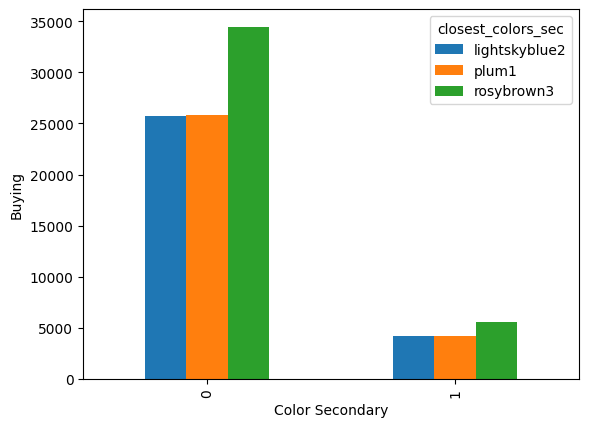

In [21]:
pd.crosstab(df.label,df.closest_colors_sec).plot.bar()
plt.xlabel('Color Secondary')
plt.ylabel('Buying')
plt.show()

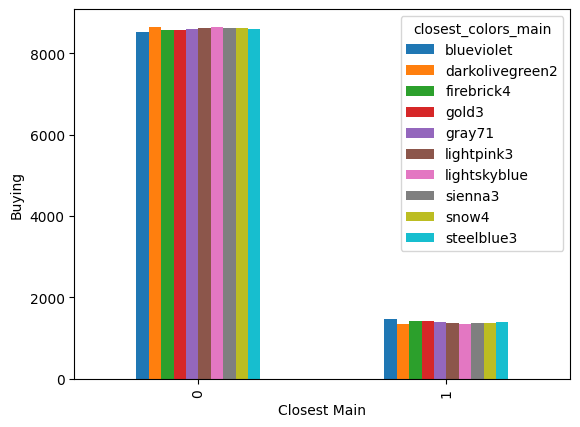

In [22]:
pd.crosstab(df.label,df.closest_colors_main).plot.bar()
plt.xlabel('Closest Main')
plt.ylabel('Buying')
plt.show()

## Exploring Genders 

ValueError: could not convert string to float: 'Germany'

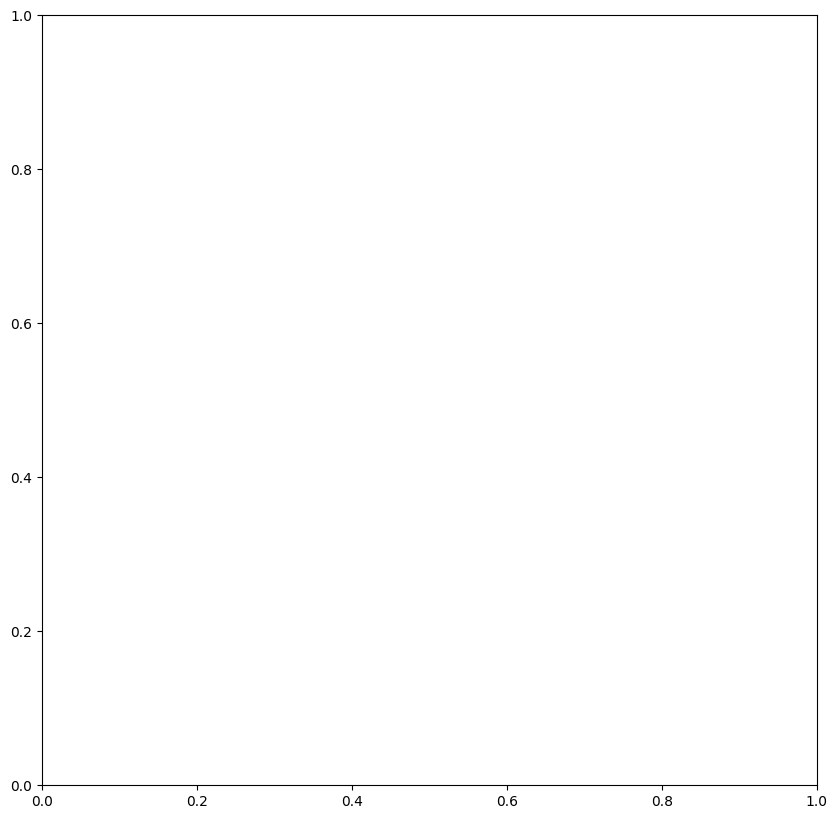

In [23]:
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(df_2.corr(),square=True,cbar=True,ax=ax,annot=True,fmt='.2f')

In [ ]:
df['style'].value_counts().sum

In [ ]:
df_2.to_csv("final2.csv")

In [ ]:
ProfileReport(df_2)

In [ ]:
import calendar

In [ ]:
df_2.dtypes

In [ ]:
df_2.retailweek

In [ ]:
# Now converting "Date"  to date time
df_2["retailweek"]=pd.to_datetime(df_2.retailweek)

# Extracting details from date given. so that can be used for seasonal checks or grouping

df_2["Day"]=df_2.retailweek.dt.day
df_2["Month"]=df_2.retailweek.dt.month
df_2["Year"]=df_2.retailweek.dt.year

# Changing the Months value from numbers to real values like Jan, Feb to Dec
df_2['Month'] = df_2['Month'].apply(lambda x: calendar.month_abbr[x])

In [ ]:
df_2.Month.value_counts().sum

In [ ]:
df_2['Week'] = df_2.retailweek.dt.isocalendar().week
df_2['Week']

In [ ]:
df_weeks = df_2.groupby('Week').sum()
df_weeks.head()

In [ ]:

import plotly.express as px
fig = px.line( data_frame = df_weeks,
              x = df_weeks.index,
              y = 'sales',
              labels = 
              {'sales' : 'Weekly Sales',
               'x' : 'Weeks' },
              title = 'Sales over weeks')
fig.update_traces(line_color='deeppink', line_width=3)

In [ ]:
df_weeks.head()

In [ ]:
def scatter(df_2, column):
    plt.figure(figsize=(10,10))
    plt.scatter(df_2[column] , df_2['sales'], color = 'turquoise')
    plt.ylabel('Weekly Sales')
    plt.xlabel(column)

In [ ]:
for i in df_2.columns:
    scatter(df_2, i)

In [ ]:
df_2['Week'] = df_2.retailweek.dt.isocalendar().week 


In [ ]:
df_2.head()

In [ ]:
weekly_sales_2014 = df_2[df_2.Year==2014]['sales'].groupby(df_2['Week']).mean()
weekly_sales_2015 = df_2[df_2.Year==2015]['sales'].groupby(df_2['Week']).mean()
weekly_sales_2016 = df_2[df_2.Year==2016]['sales'].groupby(df_2['Week']).mean()
weekly_sales_2017 = df_2[df_2.Year==2017]['sales'].groupby(df_2['Week']).mean()
plt.figure(figsize=(20,8))
sns.lineplot(x = weekly_sales_2014.index, y = weekly_sales_2014.values)
sns.lineplot(x = weekly_sales_2015.index, y = weekly_sales_2015.values)
sns.lineplot(x = weekly_sales_2016.index, y =  weekly_sales_2016.values)
sns.lineplot(x = weekly_sales_2017.index, y = weekly_sales_2017.values)
plt.grid()
plt.xticks(np.arange(1, 53, step=1))
plt.legend(['2014', '2015', '2016','2017'], loc='best', fontsize=16)
plt.title('Average Weekly Sales - Per Year', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Week', fontsize=16)
plt.show()



In [ ]:
weekly_sales_2014

In [ ]:
weekly_sales_2014.head()

In [ ]:
weekly_sales_mean = df_2['sales'].groupby(df_2['retailweek']).mean()
weekly_sales_median = df_2['sales'].groupby(df_2['retailweek']).median()
plt.figure(figsize=(20,8))
sns.lineplot(x = weekly_sales_mean.index,y =  weekly_sales_mean.values, color = 'indigo')
sns.lineplot(x = weekly_sales_median.index, y = weekly_sales_median.values, color = 'tomato')
plt.grid()
plt.legend(['Mean', 'Median'], loc='best', fontsize=16)
plt.title('Weekly Sales - Mean and Median', fontsize=18)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.show()

In [ ]:
def lin__plot (data , x):
    plt.figure(figsize=(10,5))
    sns.lineplot ( data = data, x = x, y =  'sales', hue = 'label')


In [ ]:
cols = ['regular_price', 'current_price',
       'ratio', 'retailweek', 'promo1', 'promo2','Day', 'Month', 'Year',
       'Week']

In [ ]:
for i in cols:
    lin__plot(df_2, i)

# Model Preparation

In [ ]:
import category_encoders as ce

In [ ]:
df_2.gender.value_counts().sum

In [ ]:
df_2.columns

In [ ]:
groups = ['country','productgroup','category','style','gender','closest_colors_main','sizes','closest_colors_sec']

encoder= ce.BinaryEncoder(cols=groups,return_df=True)
df_2=encoder.fit_transform(df_2) 
df_2

In [ ]:
df_2.columns


In [ ]:
df_3 = df_2[['country_0', 'country_1','sales', 'regular_price',
       'current_price', 'ratio',  'productgroup_0', 'productgroup_1',
       'productgroup_2', 'category_0', 'category_1', 'category_2', 'cost',
       'style_0', 'style_1', 'sizes_0', 'sizes_1', 'gender_0', 'gender_1', 'gender_2',
        'closest_colors_main_0', 'closest_colors_main_1',
       'closest_colors_main_2', 'closest_colors_main_3',
       'closest_colors_sec_0', 'closest_colors_sec_1', 'Day', 'Month', 'Year','label']]

In [ ]:
df_3.info()

In [ ]:
X=df_3.drop('label',axis=1)
Y=df_3['label']

In [ ]:
fig, ax = plt.subplots(figsize=(20,20))  
sns.heatmap(df_3.corr(),square=True,cbar=True,ax=ax,annot=True,fmt='.2f')

In [ ]:
ProfileReport(df_3)

In [ ]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

In [ ]:
model=DecisionTreeClassifier()
model.fit(X_train,Y_train)

In [ ]:
model.score(X_test,Y_test)

In [ ]:
model = SVC()
model.fit(X_train,Y_train)

In [ ]:
predictions = model.predict(X_test)

In [ ]:
print(classification_report(Y_test,predictions))

In [ ]:
print(confusion_matrix(Y_test,predictions))

In [ ]:

rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, Y_train)

In [ ]:
rfc_pred = rfc.predict(X_test)

In [ ]:
print(confusion_matrix(Y_test,rfc_pred))

In [ ]:
print(classification_report(Y_test,rfc_pred))

In [ ]:
logmodel = LogisticRegression()
logmodel.fit(X_train,Y_train)

In [ ]:
predictions = logmodel.predict(X_test)

In [ ]:
print(classification_report(Y_test,predictions))

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
# transform the dataset
oversample = SMOTE()
X, y = oversample.fit_resample(X, Y)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

## Decision tree

In [ ]:
model=DecisionTreeClassifier()
model.fit(X_train,y_train)

In [ ]:
model.score(X_test,y_test)

In [ ]:
predictions = model.predict(X_test)

In [ ]:
print(classification_report(y_test,predictions))

## Random Forest

In [ ]:
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)

In [ ]:
rfc_pred = rfc.predict(X_test)

In [ ]:
print(classification_report(y_test,rfc_pred))

## Support Vector Classifier

In [ ]:
model = SVC()
model.fit(X_train,y_train)

In [ ]:
predictions = model.predict(X_test)

In [ ]:
print(classification_report(y_test,rfc_pred))

## Logistic Regression

In [ ]:
logmodel = LogisticRegression(max_iter= 200)
logmodel.fit(X_train,y_train)

In [ ]:
predictions = logmodel.predict(X_test)

In [ ]:
print(classification_report(y_test,rfc_pred))